# Vehicle Detection

## 1. Load data

In [1]:
import glob

vehicles_paths = [
    "./vehicles/GTI_Far/image0*.png",
    "./vehicles/GTI_Left/image0*.png",
    "./vehicles/GTI_MiddleClose/image0*.png",
    "./vehicles/GTI_Right/image0*.png",
    "./vehicles/KITTI_extracted/*.png"
    ]
non_vehicles_paths = [
    "./non-vehicles/Extras/extra*.png",
    "./non-vehicles/GTI/image*.png"
    ]

def elements_per_class(v_paths, nv_paths):
    n_vehicles, n_nvehicles = 0, 0
    for path in v_paths:
        images = glob.glob(path)
        n_vehicles += len(images)
            
    for path in nv_paths:
        images = glob.glob(path)
        n_nvehicles += len(images)
        
    return n_vehicles, n_nvehicles

n_v, n_nv = elements_per_class(vehicles_paths, non_vehicles_paths)

print("Number of vehicles in dataset: {:d}".format(n_v))
print("Number of non-vehicles in dataset: {:d}".format(n_nv))

Number of vehicles in dataset: 8792
Number of non-vehicles in dataset: 8968


There are 8792 vehicles and 8968 non-vehicles. The dataset is roughly balanced, so there is no need to modify the original data in regards to that matter.


In [2]:
import numpy as np
import cv2

# load the data
def load_data_from_paths(v_paths, nv_paths):
    feats_data, labels_data = [], []
    for path in v_paths:
        images = glob.glob(path)
        
        for name in images:
            feats_data.append(cv2.imread(name))
            labels_data.append(0) # for vehicles
            
    for path in nv_paths:
        images = glob.glob(path)
        
        for name in images:
            feats_data.append(cv2.imread(name))
            labels_data.append(1) # for non-vehicles

    X = np.array(feats_data)
    y = np.array(labels_data)
    
    return X, y

X_all, y_all = load_data_from_paths(vehicles_paths, non_vehicles_paths)

assert len(X_all) == len(y_all)

print("Number of elements: {:d}".format(len(X_all)))

Number of elements: 17760


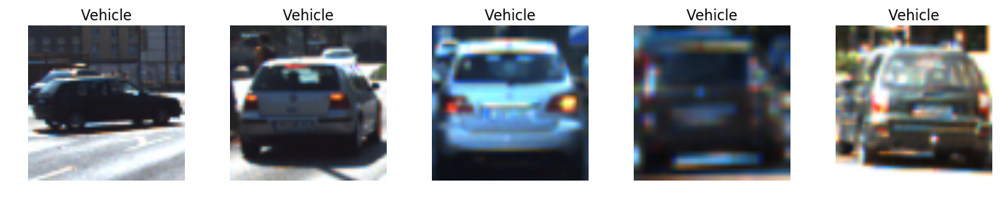

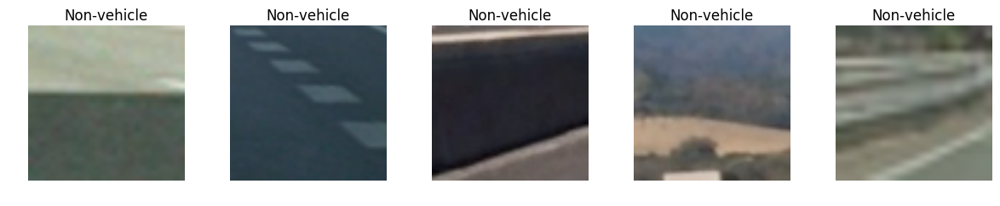

In [3]:
from random import randrange
import matplotlib.pyplot as plt
%matplotlib inline

def get_random_images(n = 1):
    vehicles = []
    non_vehicles = []
    
    while len(vehicles) < n:
        index = randrange(len(X_all))
        y = y_all[index]
        
        if y == 0:
            vehicles.append(X_all[index])
    
    while len(non_vehicles) < n:
        index = randrange(len(X_all))
        y = y_all[index]
        
        if y == 1:
            non_vehicles.append(X_all[index])
        
    return vehicles, non_vehicles


def plot_random_examples(n=1):
    vs, nvs = get_random_images(n)
    
    f, ax = plt.subplots(1, n, figsize=(12, 12))
    f.tight_layout()
    
    for i in range(n):
        ax[i].axis("off")
        ax[i].imshow(cv2.cvtColor(vs[i], cv2.COLOR_BGR2RGB))
        ax[i].set_title("Vehicle")
    
    f, ax = plt.subplots(1, n, figsize=(12, 12))
    f.tight_layout()
    for i in range(n):
        ax[i].axis("off")
        ax[i].imshow(cv2.cvtColor(nvs[i], cv2.COLOR_BGR2RGB))
        ax[i].set_title("Non-vehicle")
    
plot_random_examples(5)

## 2. Extract features

### 2.1 Image Preprocessing

Before extracting the features of the images some preprocessing needs to be done in order to highlight the characteristics of the pictures.

In this case, the contrast of the images are increased by equalizing the histogram of every channel. 

Two methods are tried. The first one increases the global contrast of the image. The second one splits the image into regions, and increases the local contrast of those regions, this method is called CLAHE (Contrast Limited Adaptive Histogram Equalization)

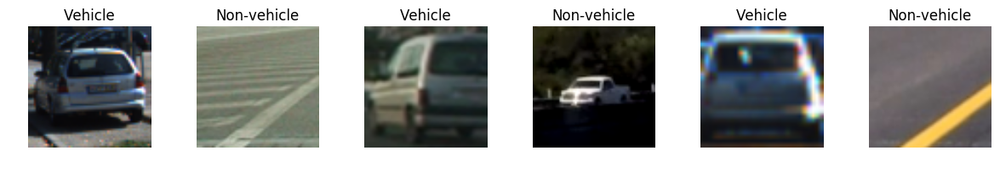

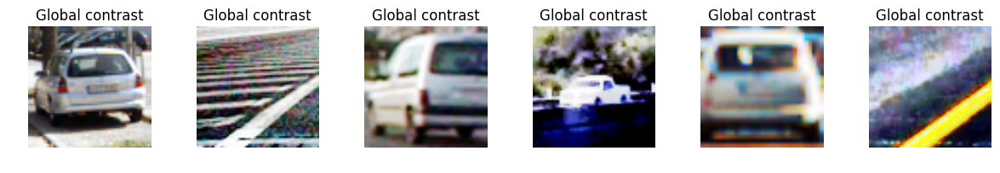

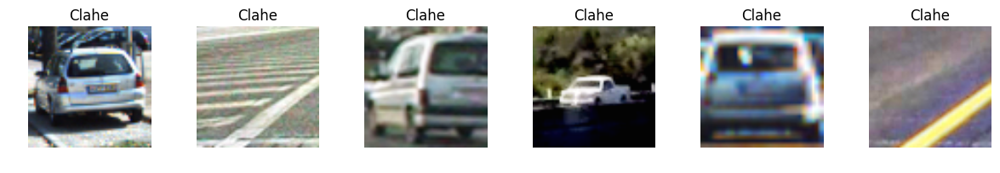

In [7]:
def global_contrast(image_aus):
    h, w, n_channels = image_aus.shape
    image_eq = np.zeros_like(image_aus)
    
    for channel in range(n_channels):
        image_eq[:, :, channel] = cv2.equalizeHist(image_aus[:, :, channel])
        
    return image_eq

def clahe(image_aus):
    h, w, n_channels = image_aus.shape
    image_eq = np.zeros_like(image_aus)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(4, 4))
    
    for channel in range(n_channels):
        image_eq[:, :, channel] = clahe.apply(image_aus[:, :, channel])
        
    return image_eq

def plot_contrast_examples(n=1):
    vs, nvs = get_random_images(n)
    
    # Define HOG parameters
    orient = 9
    pix_per_cell = 8
    cell_per_block = 2
    
    #######################################################################
    f, ax = plt.subplots(1, 2*n, figsize=(12, 12))
    f.tight_layout()
    
    for i in range(n):
        ax[2 * i].axis("off")
        ax[2 * i].imshow(cv2.cvtColor(vs[i], cv2.COLOR_BGR2RGB))
        ax[2 * i].set_title("Vehicle")
        
        ax[2 * i + 1].axis("off")
        ax[2 * i + 1].imshow(cv2.cvtColor(nvs[i], cv2.COLOR_BGR2RGB))
        ax[2 * i + 1].set_title("Non-vehicle")
    #######################################################################
    f, ax = plt.subplots(1, 2*n, figsize=(12, 12))
    f.tight_layout()
    
    for i in range(n):
        ax[2 * i].axis("off")
        ax[2 * i].imshow(global_contrast(cv2.cvtColor(vs[i], cv2.COLOR_BGR2RGB)))
        ax[2 * i].set_title("Global contrast")
        
        ax[2 * i + 1].axis("off")
        ax[2 * i + 1].imshow(global_contrast(cv2.cvtColor(nvs[i], cv2.COLOR_BGR2RGB)))
        ax[2 * i + 1].set_title("Global contrast")
    #######################################################################
    f, ax = plt.subplots(1, 2*n, figsize=(12, 12))
    f.tight_layout()
    
    for i in range(n):
        ax[2 * i].axis("off")
        ax[2 * i].imshow(clahe(cv2.cvtColor(vs[i], cv2.COLOR_BGR2RGB)))
        ax[2 * i].set_title("Clahe")
        
        ax[2 * i + 1].axis("off")
        ax[2 * i + 1].imshow(clahe(cv2.cvtColor(nvs[i], cv2.COLOR_BGR2RGB)))
        ax[2 * i + 1].set_title("Clahe")
    
plot_contrast_examples(3)

Global contrast and clahe do a good work by highlighting the features of the images. However, global contrast adds some unnecessary noise to the resulting pictures.


### 2.2 HOG

Now, it is time to compute the gradients of the pixels for both classes. The gradients are computed over the grayscale version of the processed image.


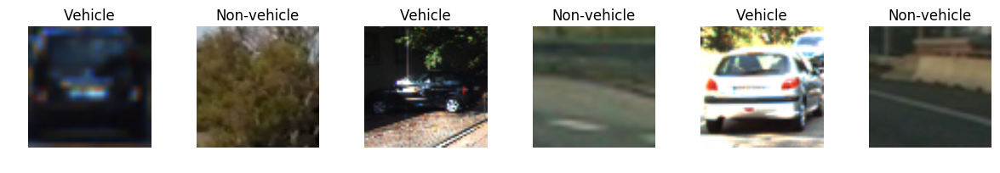

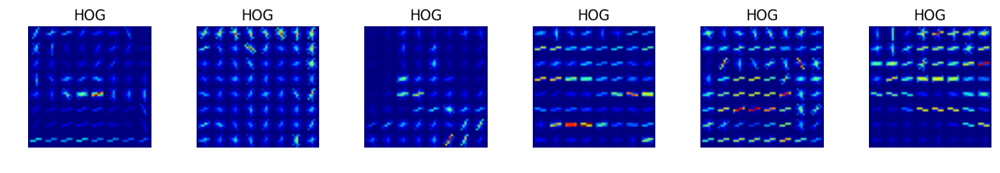

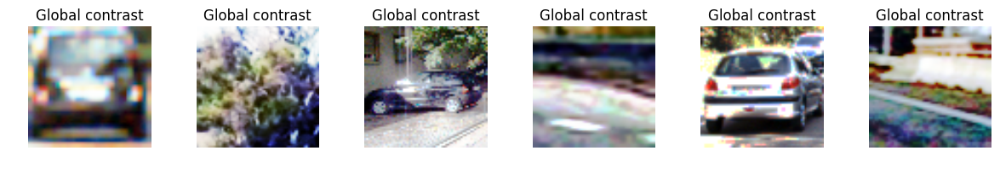

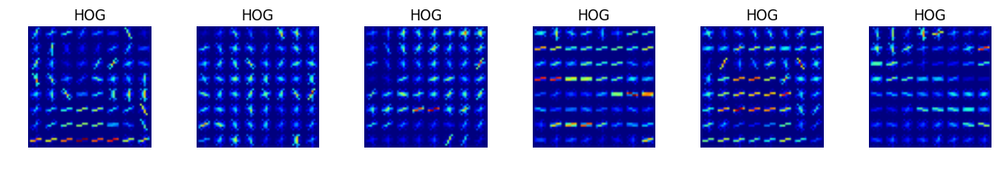

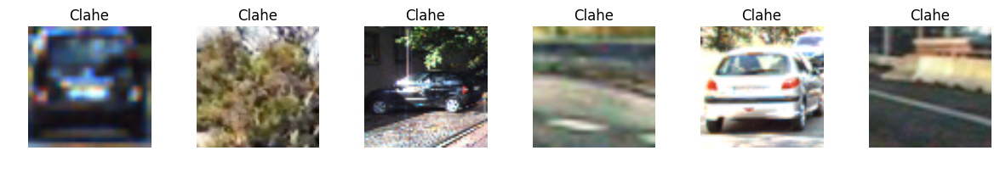

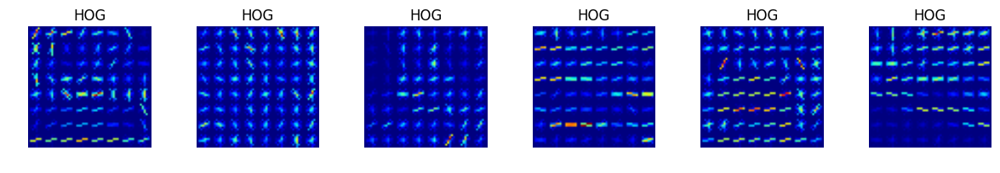

In [8]:
from skimage.feature import hog

# from https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/d479f43a-7bbb-4de7-9452-f6b991ece599
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    if vis == True:
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=False, 
                                  visualise=True, feature_vector=False)
        return features, hog_image
    else:      
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=False, 
                       visualise=False, feature_vector=feature_vec)
        return features

def plot_hog(images):
    n = len(images)
    f, ax = plt.subplots(5, n, figsize=(16, 16))
    
    for image, i in zip(images, range(n)):
        
        ax[0][i].axis("off")
        ax[0][i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        ax[0][i].set_title("RGB image")
                       
        # Define HOG parameters
        orient = 9
        pix_per_cell = 8
        cell_per_block = 2
        
        image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        features_gray, hog_image_gray = get_hog_features(
            image_gray, 
            orient, 
            pix_per_cell, 
            cell_per_block, 
            vis=True, 
            feature_vec=False
        )
        
        ax[1][i].axis("off")
        ax[1][i].imshow(hog_image_gray, cmap="gray")
        ax[1][i].set_title("HOG gray")
        
        ax[2][i].plot(np.ravel(features_gray))
        
        image_aus = process_image(image)
        features_aus, hog_image_aus = get_hog_features(
            image_aus[:, :, 2], 
            orient, 
            pix_per_cell, 
            cell_per_block, 
            vis=True, 
            feature_vec=False
        )
        
        ax[3][i].axis("off")
        ax[3][i].imshow(hog_image_aus, cmap="gray")
        ax[3][i].set_title("HOG AUS Channel 2")
        
        ax[4][i].plot(np.ravel(features_aus))
        
#     plt.xlim(0, 256)


def plot_random_hog(n=1):
    vs, nvs = get_random_images(n)
    
    # Define HOG parameters
    orient = 9
    pix_per_cell = 8
    cell_per_block = 2
    
    #######################################################################
    f, ax = plt.subplots(1, 2*n, figsize=(12, 12))
    f.tight_layout()
    
    for i in range(n):
        ax[2 * i].axis("off")
        ax[2 * i].imshow(cv2.cvtColor(vs[i], cv2.COLOR_BGR2RGB))
        ax[2 * i].set_title("Vehicle")
        
        ax[2 * i + 1].axis("off")
        ax[2 * i + 1].imshow(cv2.cvtColor(nvs[i], cv2.COLOR_BGR2RGB))
        ax[2 * i + 1].set_title("Non-vehicle")
    #######################################################################
    f, ax = plt.subplots(1, 2*n, figsize=(12, 12))
    f.tight_layout()
    
    for i in range(n):
        gr = cv2.cvtColor(vs[i], cv2.COLOR_BGR2GRAY)
        features_gray, hog_image_gray = get_hog_features(
            gr, 
            orient, 
            pix_per_cell, 
            cell_per_block, 
            vis=True, 
            feature_vec=False
        )
        ax[2 * i].axis("off")
        ax[2 * i].imshow(hog_image_gray)
        ax[2 * i].set_title("HOG")
        
        gr = cv2.cvtColor(nvs[i], cv2.COLOR_BGR2GRAY)
        features_gray, hog_image_gray = get_hog_features(
            gr, 
            orient, 
            pix_per_cell, 
            cell_per_block, 
            vis=True, 
            feature_vec=False
        )
        ax[2 * i + 1].axis("off")
        ax[2 * i + 1].imshow(hog_image_gray)
        ax[2 * i + 1].set_title("HOG")
    #######################################################################
    f, ax = plt.subplots(1, 2*n, figsize=(12, 12))
    f.tight_layout()
    
    for i in range(n):
        ax[2 * i].axis("off")
        ax[2 * i].imshow(global_contrast(cv2.cvtColor(vs[i], cv2.COLOR_BGR2RGB)))
        ax[2 * i].set_title("Global contrast")
        
        ax[2 * i + 1].axis("off")
        ax[2 * i + 1].imshow(global_contrast(cv2.cvtColor(nvs[i], cv2.COLOR_BGR2RGB)))
        ax[2 * i + 1].set_title("Global contrast")
    #######################################################################
    f, ax = plt.subplots(1, 2*n, figsize=(12, 12))
    f.tight_layout()
    
    for i in range(n):
        gc = global_contrast(cv2.cvtColor(vs[i], cv2.COLOR_BGR2RGB))
        gr = cv2.cvtColor(gc, cv2.COLOR_RGB2GRAY)
        features_gray, hog_image_gray = get_hog_features(
            gr, 
            orient, 
            pix_per_cell, 
            cell_per_block, 
            vis=True, 
            feature_vec=False
        )
        ax[2 * i].axis("off")
        ax[2 * i].imshow(hog_image_gray)
        ax[2 * i].set_title("HOG")
        
        gc = global_contrast(cv2.cvtColor(nvs[i], cv2.COLOR_BGR2RGB))
        gr = cv2.cvtColor(gc, cv2.COLOR_RGB2GRAY)
        features_gray, hog_image_gray = get_hog_features(
            gr, 
            orient, 
            pix_per_cell, 
            cell_per_block, 
            vis=True, 
            feature_vec=False
        )
        ax[2 * i + 1].axis("off")
        ax[2 * i + 1].imshow(hog_image_gray)
        ax[2 * i + 1].set_title("HOG")
    #######################################################################
    f, ax = plt.subplots(1, 2*n, figsize=(12, 12))
    f.tight_layout()
    
    for i in range(n):
        ax[2 * i].axis("off")
        ax[2 * i].imshow(clahe(cv2.cvtColor(vs[i], cv2.COLOR_BGR2RGB)))
        ax[2 * i].set_title("Clahe")
        
        ax[2 * i + 1].axis("off")
        ax[2 * i + 1].imshow(clahe(cv2.cvtColor(nvs[i], cv2.COLOR_BGR2RGB)))
        ax[2 * i + 1].set_title("Clahe")
    #######################################################################
    f, ax = plt.subplots(1, 2*n, figsize=(12, 12))
    f.tight_layout()
    
    for i in range(n):
        gc = clahe(cv2.cvtColor(vs[i], cv2.COLOR_BGR2RGB))
        gr = cv2.cvtColor(gc, cv2.COLOR_RGB2GRAY)
        features_gray, hog_image_gray = get_hog_features(
            gr, 
            orient, 
            pix_per_cell, 
            cell_per_block, 
            vis=True, 
            feature_vec=False
        )
        ax[2 * i].axis("off")
        ax[2 * i].imshow(hog_image_gray)
        ax[2 * i].set_title("HOG")
        
        gc = clahe(cv2.cvtColor(nvs[i], cv2.COLOR_BGR2RGB))
        gr = cv2.cvtColor(gc, cv2.COLOR_RGB2GRAY)
        features_gray, hog_image_gray = get_hog_features(
            gr, 
            orient, 
            pix_per_cell, 
            cell_per_block, 
            vis=True, 
            feature_vec=False
        )
        ax[2 * i + 1].axis("off")
        ax[2 * i + 1].imshow(hog_image_gray)
        ax[2 * i + 1].set_title("HOG")

plot_random_hog(3)


### 2.3 Final features
The HOG process outputs 1764 features. This value is obtained from the parameters used to perform HOG. Nine orientations are good enough to determine the direction of the gradients in every cell (as stated in the theory). The number of pixels in every cell is eight to ensure that all the pixels are used (the dimensions of the images used to train the model is 64x64). Then every block is made of two cells horizontally and vertically which results in 7 blocks in every direction. 

7 vertical blocks x 7 horizontal blocks x 2 horizontal cells per block x 2 vertical cells per block x 9 orientations = 1764 features

Other values can be added including the colors histograms, however the number of features thrown by HOG are good enough to train the classifier.

In [10]:
def extract_features(image_bgr):
#     image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
#     image_clahe = clahe(image_rgb)
    image_clahe = clahe(image_bgr)
    image_gray = cv2.cvtColor(image_clahe, cv2.COLOR_RGB2GRAY)
    
    # Define HOG parameters
    orient = 9
    pix_per_cell = 8
    
    cell_per_block = 2
    
    hog_feats = get_hog_features(
            image_gray, 
            orient, 
            pix_per_cell, 
            cell_per_block, 
            vis=False, 
            feature_vec=True
        )

    return hog_feats


### 2.4 Normalization

This step is meant to reduce the influence of features with high values when training the model. Therefore, the normalization allows that all components have roughly the same influence in the entire set.

In [11]:
from sklearn.externals import joblib
from sklearn.preprocessing import StandardScaler

def get_scaler():
    hog_features = []
    for element in X_all:
        hog_features.append(extract_features(element))
        
    hog_features = np.array(hog_features)
    
    X_scaler = StandardScaler().fit(hog_features)
    
    return X_scaler

X_scaler = get_scaler()
joblib.dump(X_scaler, 'scaler.pkl') 

['scaler.pkl']

/home/sebastian/anaconda3/lib/python3.5/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
/home/sebastian/anaconda3/lib/python3.5/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
/home/sebastian/anaconda3/lib/python3.5/site-packages/sklearn/preprocessing/data.py:649: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1,

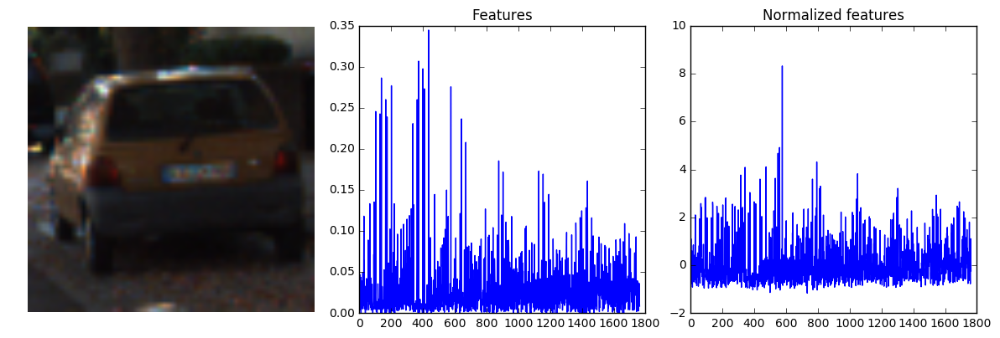

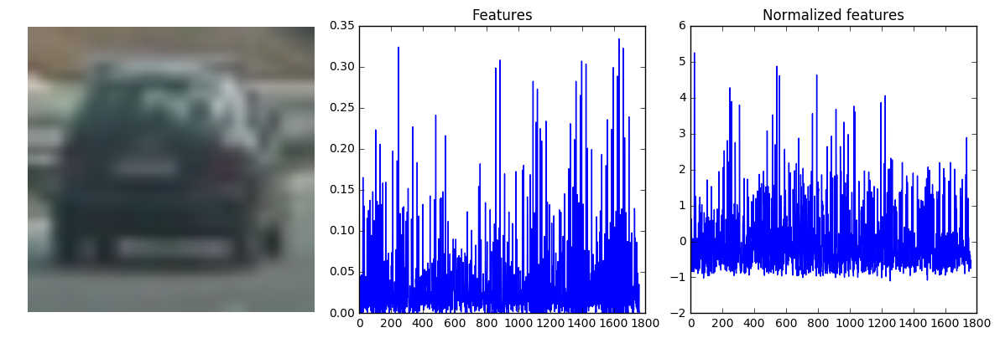

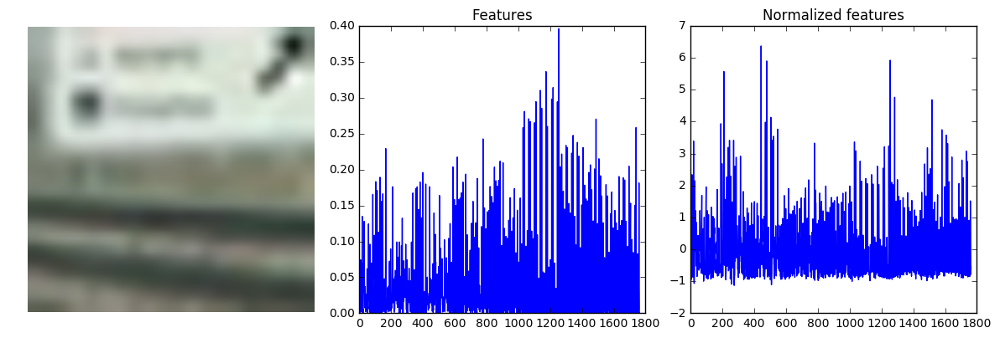

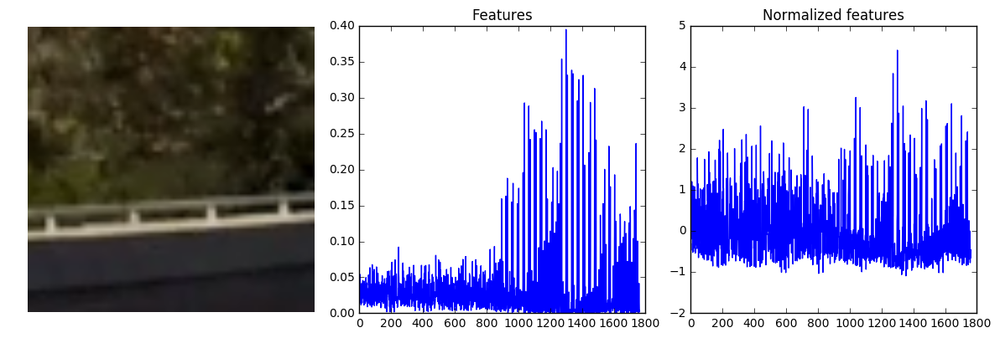

In [12]:
def plot_normalized_features(n=2):
    vs, nvs = get_random_images(n)
    
    for v in vs:
        feats = extract_features(v)
        n_feats = X_scaler.transform(feats)
        
        f, ax = plt.subplots(1, 3, figsize=(12, 4))
        f.tight_layout()
        
        ax[0].imshow(cv2.cvtColor(v, cv2.COLOR_BGR2RGB))
        ax[0].axis("off")
        
        ax[1].plot(feats)
        ax[1].set_title("Features")
        
        ax[2].plot(n_feats)
        ax[2].set_title("Normalized features")
        
    for v in nvs:
        feats = extract_features(v)
        n_feats = X_scaler.transform(feats)
        
        f, ax = plt.subplots(1, 3, figsize=(12, 4))
        f.tight_layout()
        
        ax[0].imshow(cv2.cvtColor(v, cv2.COLOR_BGR2RGB))
        ax[0].axis("off")
        
        ax[1].plot(feats)
        ax[1].set_title("Features")
        
        ax[2].plot(n_feats)
        ax[2].set_title("Normalized features")
        
plot_normalized_features(2)

## 3. Select and train a classifier

There are some classifiers that can be used for object recognition including Decision Trees and Support Vector Machines. Nonetheless, a deep neural network is used to detect vehicles. The architecture is composed of eight hidden layers with RELU activations after each one; an Adam optimizer is used as the Gradient Descent scheme.

In [13]:
from sklearn.model_selection import train_test_split

X_feats_all = []
for el in X_all:
    X_feats_all.append(extract_features(el))

X_feats_all = np.array(X_feats_all)

X_train, X_test, y_train, y_test = train_test_split(X_feats_all, y_all, test_size=0.3, random_state=50)

Using TensorFlow backend.


Epoch 1/30
3200/3200 [==============================] - 4s - loss: 0.2931 - acc: 0.6425 - val_loss: 0.1031 - val_acc: 0.8463
Epoch 2/30
3200/3200 [==============================] - 4s - loss: 0.0740 - acc: 0.9134 - val_loss: 0.0538 - val_acc: 0.9420
Epoch 3/30
3200/3200 [==============================] - 4s - loss: 0.0451 - acc: 0.9456 - val_loss: 0.0335 - val_acc: 0.9679
Epoch 4/30
3200/3200 [==============================] - 4s - loss: 0.0282 - acc: 0.9700 - val_loss: 0.0234 - val_acc: 0.9764
Epoch 5/30
3200/3200 [==============================] - 4s - loss: 0.0242 - acc: 0.9713 - val_loss: 0.0317 - val_acc: 0.9790
Epoch 6/30
3200/3200 [==============================] - 4s - loss: 0.0239 - acc: 0.9803 - val_loss: 0.0162 - val_acc: 0.9807
Epoch 7/30
3200/3200 [==============================] - 4s - loss: 0.0141 - acc: 0.9850 - val_loss: 0.0185 - val_acc: 0.9760
Epoch 8/30
3200/3200 [==============================] - 4s - loss: 0.0152 - acc: 0.9825 - val_loss: 0.0144 - val_acc: 0.9824


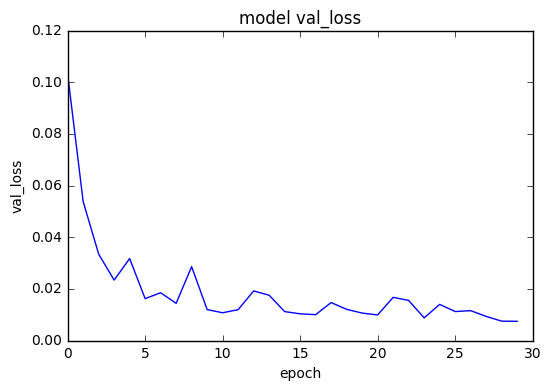

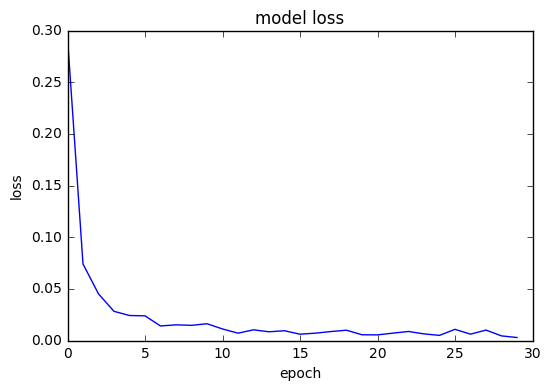

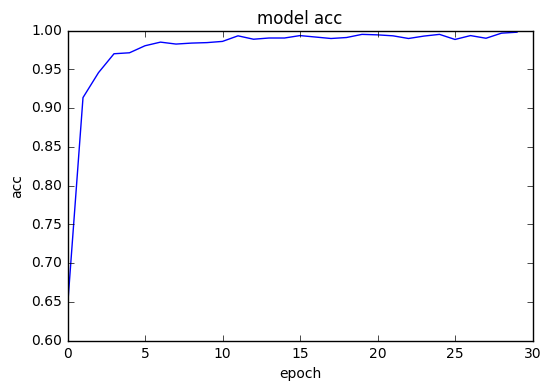

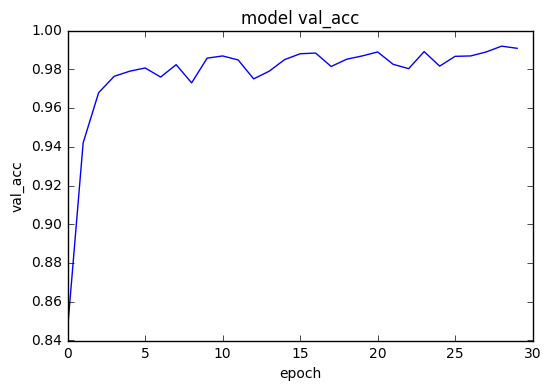

In [14]:
from keras.models import Sequential
from keras.layers import Dense, Flatten, ELU, Activation, Lambda, Dropout
from keras.layers.convolutional import Convolution2D
from keras.optimizers import Adam
    
def get_model(learning, n_feats):
        
    model = Sequential()
    model.add(Activation('relu', batch_input_shape=(None, n_feats)))

    model.add(Dense(1250))
    model.add(Activation('relu'))
    
    model.add(Dense(1000))
    model.add(Activation('relu'))
    
    model.add(Dense(750))
    model.add(Activation('relu'))
    
    model.add(Dense(500))
    model.add(Activation('relu'))
    
    model.add(Dense(250))
    model.add(Activation('relu'))

    model.add(Dense(100))
    model.add(Activation('relu'))
    
    model.add(Dense(50))
    model.add(Activation('relu'))

    model.add(Dense(10))
    model.add(Activation('relu'))

    model.add(Dense(1))

    optimizer = Adam(lr=learning)
    model.compile(optimizer=optimizer, loss="mse", metrics=['accuracy'])

    return model

from random import randrange

def generator(X, y, batch_size):

    total_input = len(X)
    
    while True:
        features, targets = [], []
        i = 0
        while len(features) < batch_size:
            index = randrange(0, total_input)
            feats = X[index]
            labels = y[index]
           
            features.append(feats)
            targets.append(labels)
            
        yield (np.array(features), np.array(targets))

def getFeaturesTargets(X, y):
    feats = []
    targets = []
    for feat, label in zip(X, y):
        feats.append(feat)
        targets.append(label)

    return np.array(feats), np.array(targets)

def plot_metrics(history):
    keys = history.history.keys()

    for k in keys:
        plt.clf()
        plt.plot(history.history[k])
        plt.title("model " + k)
        plt.ylabel(k)
        plt.xlabel('epoch')
        plt.show()
        
import json

def train_model(X_train, y_train, X_val, y_val):
    learning_rate = 0.001
    training_size = 3200
    batch_size = 160
#     epochs = 30
    epochs = 30

    model = get_model(learning_rate, len(X_train[0]))

    history =  model.fit_generator(
            generator(X_train, y_train, batch_size),
            samples_per_epoch = training_size,
            validation_data = getFeaturesTargets(X_val, y_val),
            nb_epoch = epochs
        )
 
    model.save_weights("model.h5")
    with open("model.json", "w+") as outfile:
        json.dump(model.to_json(), outfile)

    plot_metrics(history)        

train_model(X_train, y_train, X_test, y_test)

As shown by the previous plots, the model reaches a very good accuracy ~0.99. This value is reached by increasing the number of hidden layers and adding RELU activations after each one.


## 4. Slide image
Define the sections of the image that will be used as input for the trained model to detect the presence of a vehicle.

### 4.1 Define the region of interest

In order to increase efficiency, a region of interest will be defined. This space is where it is more likely to find a vehicle. The sliding will be done in this area.


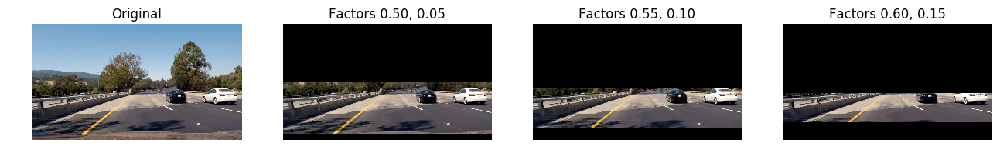

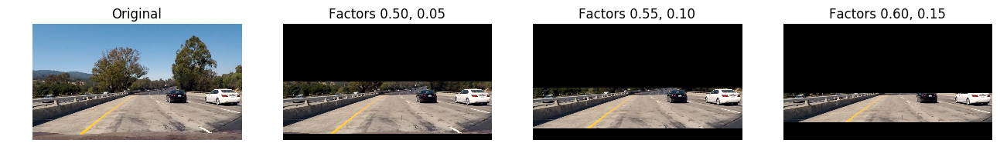

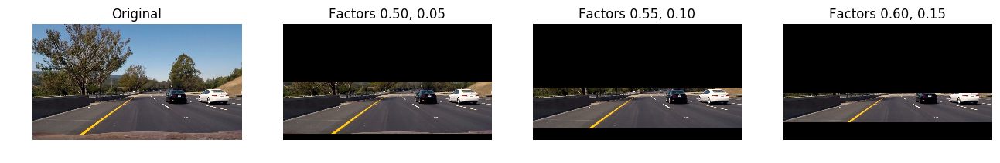

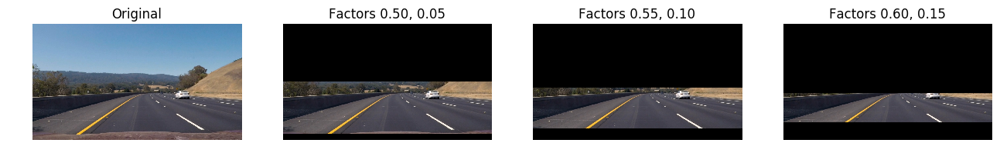

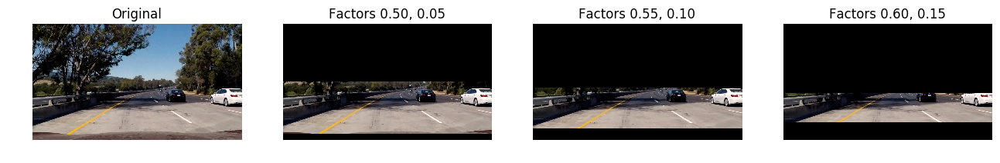

In [15]:
def plot_regions(image, factors):
    n_regions = len(factors)
    h, w, d = image.shape
    
    f, ax = plt.subplots(1, n_regions + 1, figsize=(16,16))
    
    ax[0].axis("off")
    ax[0].set_title("Original")
    ax[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    
    for fac, i in zip(factors, range(n_regions)):
        end = int(h * fac[0])
        start = int(h * (1 - fac[1]))
        
        f_image = np.copy(image)
        f_image[:end, :, :] = [0, 0, 0]
        f_image[start:, :, :] = [0, 0, 0]
        
        ax[i + 1].axis("off")
        ax[i + 1].set_title("Factors {:.2f}, {:.2f}".format(fac[0], fac[1]))
        ax[i + 1].imshow(cv2.cvtColor(f_image, cv2.COLOR_BGR2RGB))
        
        
def visualize_regions_of_interest(factors=[(0.5, 0.05), (0.55, 0.10), (0.6, 0.15)]):
    
    images = glob.glob('./test_images/test*.jpg')
    
    for fname in images:
        im_test_bgr = cv2.imread(fname)
        plot_regions(im_test_bgr, factors)

visualize_regions_of_interest()


The previous images show that a factor of .55 defines very well the area of interest. This factor means that 55% (upper side) of the image won't be part of the sliding. The same is true for the second factor, in this case, the best factor is 10%. This means that 10% (lower side) of the image will not be used for sliding.

### 4.2 Multiscale and Overlapping
Because of the effect of the perspective in the images, objects that are far from the camera look smaller. In addition, in this particular project, vehicles in front of the camera does not look similar to vehicles located to the left of the right; cars in the latter positions show more of their structure, not just the rear part.

The overlapping process ensures redundancy when detecting vehicles and discards false positives through the use of a heat map.

Based on the previous assumption, segmenting the area of interest requires different sizes of the windows to do so.

#### 4.2.1 Vertical segmentation

The segmentation of the image is done in a geometric way by determining the best ratio between segments. All the segments are overlapped. The objective is to find the best ratio and number of segments for the region of interest.


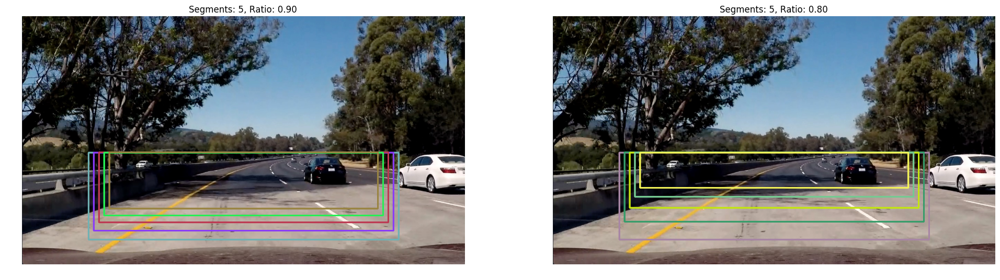

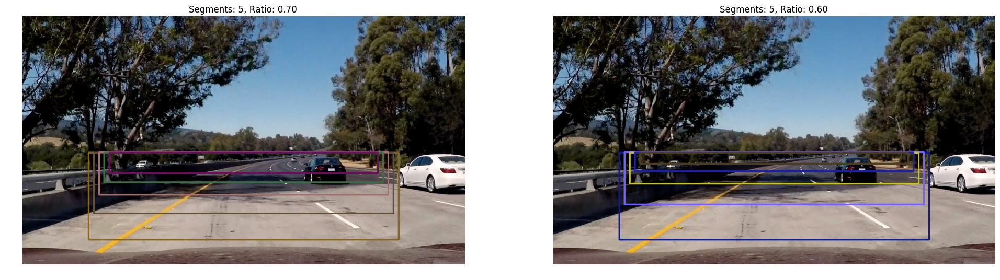

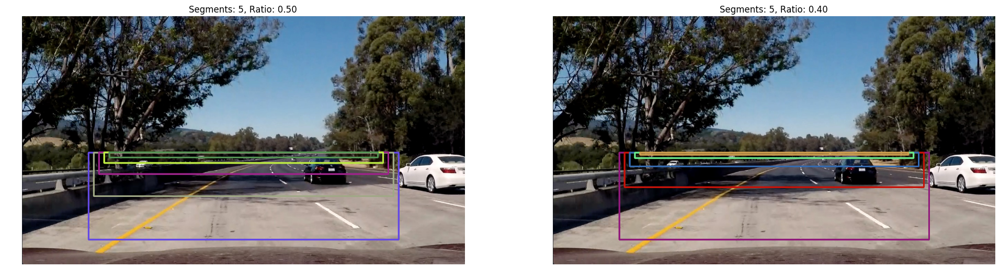

In [16]:
from random import randrange

def random_color():
    return (randrange(256), randrange(256), randrange(256))

def vertical_segment_image(image_shape, n_segments, ratio, height_factor=(.55, .10)):
    h, w, d = image_shape
    
    start = int(h * height_factor[0]) # top start point of area of interest
    end = int(h * (1 - height_factor[1])) # bottom end point of area of interest

    h_region = end - start # height of area of interest

    heights_centroids = [] # heights and centroids of the segments
    
    # Height and centroid of initial segment is the same for every ratio
    h_segment_b = int(h_region) # height of bottom-most segment
    c_segment_b = start + int(h_segment_b / 2) # centroid of bottom-most segment

    heights_centroids.append([h_segment_b, c_segment_b])

    h_current_segment = h_segment_b
    
    for i in range(1, n_segments):
        h_new_segment = int(h_current_segment * ratio)
        c_new_segment = start + int(h_new_segment / 2)

        heights_centroids.append([h_new_segment, c_new_segment])

        h_current_segment = h_new_segment

    return heights_centroids
        
def plot_segments(image, n_segments, ratios):
    n_ratios = len(ratios)
    h, w, d = image.shape
   
    f, ax = plt.subplots(1, n_ratios, figsize=(24, 24))
    for ratio, j in zip(ratios, range(n_ratios)):
        heights_centroids = vertical_segment_image(image.shape, n_segments, ratio)
        
        image_to_draw = np.copy(image)
        
        for hc, i in zip(heights_centroids, range(len(heights_centroids))):
            start_p = (int(w * .15) + 15 * i, int(hc[1] - (hc[0] / 2)))
            end_p = (int(w *.85) - 15 * i, int(hc[1] + (hc[0] / 2)))
            cv2.rectangle(image_to_draw, start_p, end_p, random_color(), 3)

        ax[j].imshow(cv2.cvtColor(image_to_draw, cv2.COLOR_BGR2RGB))
        ax[j].axis("off")
        ax[j].set_title("Segments: {:d}, Ratio: {:.2f}".format(n_segments, ratio))
        
def visualize_segments(n_segments = 5, ratios=[0.8, 0.7, 0.6], size_factor=0.25):
        
    im_test_bgr = cv2.imread("./test_images/test5.jpg")
    plot_segments(im_test_bgr, n_segments, ratios)
        
visualize_segments(5, [0.9, 0.8])
visualize_segments(5, [0.7, 0.6])
visualize_segments(5, [0.5, 0.4])

After analyzing the results of the previous images, the best configuration for the vertical segmentation is the following:

- Number of segments: 5
- Reduction ratio: 0.7
  
Reduction ratio represents how big is the next segment compared to the previous one, in this case, the height of the second segment is 70% the height of the first segment.


#### 4.2.2 Horizontal segmentation

For the sake of simplicity, the horizontal segmentation will be done based on the vertical segmentation. The height of a vertical segment will be used for the width of a box used to "patch" that segment. During this process, an overlap factor is needed so two continous segments share the same area.

#### 4.2.3 Combined segmentation

Simply combine vertical and horizontal segmentation

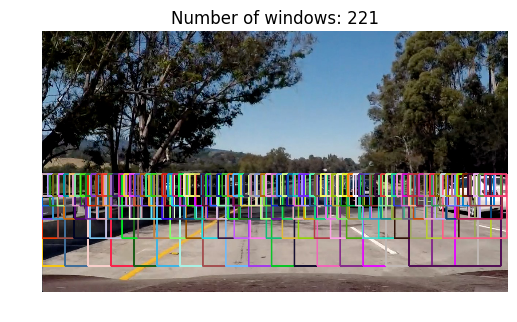

In [17]:
def segment_image(image_shape, h_overlap=0.25):
    h, w, d = image_shape
    heights_centroids = vertical_segment_image(image_shape, 5, 0.70)
    boxes = []
    
    for hc in heights_centroids:
        bw = bh = hc[0]
        ct = hc[1]
        overlap = int(bw * h_overlap)
               
        n_vertical_boxes = int(((w - bw) / overlap) + 1)
        for i in range(n_vertical_boxes):
            start_p = (i * overlap, int(ct - (bh / 2)))
            end_p = ((i * overlap) + bw, int(ct + (bh / 2)))
            
            boxes.append((start_p, end_p))

    return boxes

def plot_boxes():
    im_test_bgr = cv2.imread("./test_images/test5.jpg")
    boxes = segment_image(im_test_bgr.shape)
    
    for box in boxes:
        cv2.rectangle(im_test_bgr, box[0], box[1], random_color(), 3)


    plt.imshow(cv2.cvtColor(im_test_bgr, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title("Number of windows: {:d}".format(len(boxes)))
    
plot_boxes()

## 5. Vehicle detection

Here, the images are segmented based on the scheme described above. Then, every segment is pre-processed to adjust the contrast (clahe) and the size, so the features can be extracted. 

The features are passed to the classifier which determines the corresponding class for that segment. Every segment that is classified as vehicle is passed to a heat map. The area covered by the segment increases its intensity.

Finally, a threshold is applied to the heat map to filter the areas with less intensity (which are likely to be false positives). The result of this process corresponds to the areas where vehicles are located.


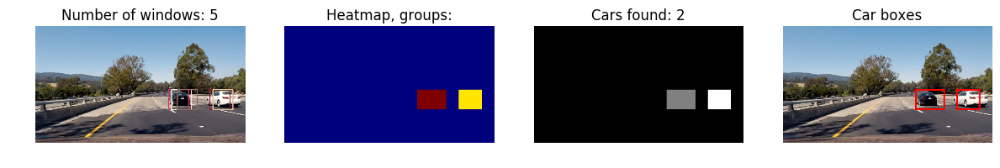

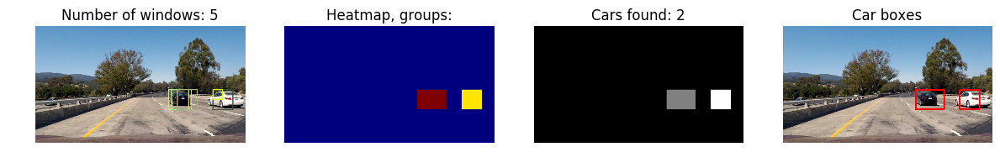

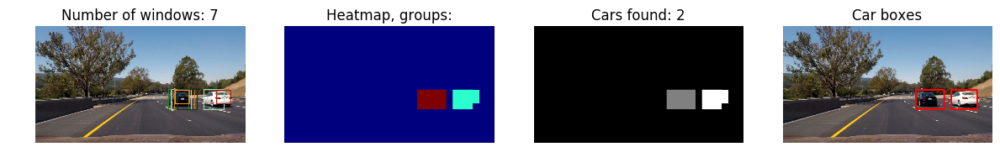

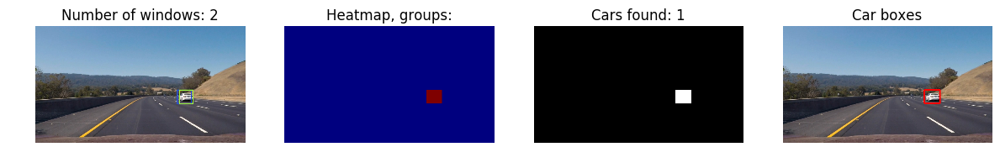

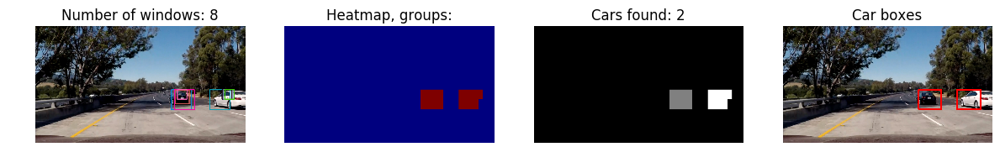

In [18]:
from keras.models import model_from_json
from scipy.ndimage.measurements import label
import warnings
warnings.filterwarnings('ignore')

def vertical_segments(image):
    image_shape = image.shape
    h, w, d = image.shape
    heights_centroids = vertical_segment_image(image_shape, 5, 0.70)
    
    boxes = []
    for hc in heights_centroids:
        start_p = (0, int(hc[1] - (hc[0] / 2)))
        end_p = (w - 1, int(hc[1] + (hc[0] / 2)))
        
        boxes.append((start_p, end_p))
        
    return boxes

# returns coordinates of boxes classified as vehicles
def classify_segment(seg_bgr, clf, scaler, threshold, h_overlap):
    h, w, d = seg_bgr.shape
    bw = bh = h

    overlap = int(bw * h_overlap)
    n_boxes = int(((w - bw) / overlap) + 1)
    
    vehicles = []
    
    for i in range(n_boxes):
        start_p = (i * overlap, 0)
        end_p = ((i * overlap) + bw, bh)

        box = seg_bgr[start_p[1]:end_p[1], start_p[0]:end_p[0]]
        box_rszd = cv2.resize(box, (64, 64), interpolation = cv2.INTER_CUBIC)
        box_feats = extract_features(box_rszd)

        box_feats = scaler.transform(box_feats)
        
        pred = clf.predict(box_feats.reshape((1, -1)), batch_size=1)
#         print(pred)
        pred = np.abs(pred[0][0])
        
        
        pred = 0 if pred < threshold else 1

        if pred == 0: # vehicle predicted
            vehicles.append([start_p, end_p])
        
    return vehicles

    
def detect_vehicles(image_bgr, clf, scaler, threshold, h_overlap=0.15):
   
    # obtain vertical segments
    v_boxes = vertical_segments(image_bgr)
    veh_boxes = []
    
    for vbox in v_boxes:
        p_start = vbox[0]
        p_end = vbox[1]
        
        # obtain the region of every box
        segment_bgr = image_bgr[p_start[1]:p_end[1], p_start[0]:p_end[0], :]
        sh, sw, sd = segment_bgr.shape
        
        veh_coords = classify_segment(segment_bgr, clf, scaler, threshold, h_overlap)
        
        hf = wf = 1
        for coo in veh_coords:
            start_x = int((coo[0][0] * wf))
            start_y = int((coo[0][1] * hf) + p_start[1])
            end_x = int((coo[1][0] * wf))
            end_y = int((coo[1][1] * hf) + p_start[1])
            centroid_x = int((end_x - start_x) / 2)
            centroid_y = ((end_y - start_y) / 2)
            width = end_x - start_x
            height = end_y - start_y
            
            n_coo = [(start_x, start_y), (end_x, end_y)]
            veh_boxes.append(n_coo)
            
    return veh_boxes

# from https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/fd66c083-4ccb-4fe3-bda1-c29db76f50a0/concepts/de41bff0-ad52-493f-8ef4-5506a279b812#
def add_heat(heatmap, bbox_list, overall=True):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1
    
    if overall:
        for box in bbox_list:
            # Add += 1 for all pixels inside each bbox
            # Assuming each "box" takes the form ((x1, y1), (x2, y2))
            max_heat = np.max(heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]])
            heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] = max_heat

    # Return updated heatmap
    return heatmap

def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    boxes = []
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        
        start_x = np.min(nonzerox)
        start_y = np.min(nonzeroy)
        end_x = np.max(nonzerox)
        end_y = np.max(nonzeroy)
        
        bbox = [(start_x, start_y), (end_x, end_y)]
        boxes.append(bbox)
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 3)
    # Return the image
    return img, boxes

def plot_vehicles_detected(threshold, min_boxes, h_overlap):
    
    with open("model.json", 'r') as jfile:
        model = model_from_json(json.loads(jfile.read()))\


    model.compile("adam", "mse")
    model.load_weights("model.h5")
    
    scaler = joblib.load("scaler.pkl")
    
    files = glob.glob("./test_images/test*.jpg")
    
    for fname in files:
        
        im_test_bgr = cv2.imread(fname)
        im_test_bgr = cv2.resize(im_test_bgr, (640, 360), interpolation = cv2.INTER_CUBIC)
        im_cars_bgr = np.copy(im_test_bgr)
        
        boxes = detect_vehicles(im_test_bgr, model, scaler, threshold, h_overlap)
        heat_map = np.zeros_like(cv2.cvtColor(im_test_bgr, cv2.COLOR_BGR2GRAY))
        heat_map = add_heat(heat_map, boxes)
        heat_map = apply_threshold(heat_map, min_boxes)
        labels = label(heat_map)
        img_cars_bgr, bboxes = draw_labeled_bboxes(im_cars_bgr, labels)

        for box in boxes:
            cv2.rectangle(im_test_bgr, box[0], box[1], random_color(), 2)

        f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(12, 12))
        
        ax1.imshow(cv2.cvtColor(im_test_bgr, cv2.COLOR_BGR2RGB))
        ax1.set_title("Number of windows: {:d}".format(len(boxes)))
        ax1.axis("off")
        
        ax2.imshow(heat_map)
        ax2.set_title("Heatmap, groups:")
        ax2.axis("off")
        
        ax3.imshow(labels[0], cmap="gray")
        ax3.set_title("Cars found: {:d}".format(labels[1]))
        ax3.axis("off")
        
        ax4.imshow(cv2.cvtColor(im_cars_bgr, cv2.COLOR_BGR2RGB))
        ax4.set_title("Car boxes")
        ax4.axis("off")
        
        f.tight_layout()

plot_vehicles_detected(1, 1, 0.15)


## 6. Video pipeline

Here the process is the same presented in step 5 with a couple of additions. First, an accumulation heat map is used to determine the presence of a vehicle in a frame based on the results in previous frames. This accumulation heat map is also filtered with a threshold to discard the less intense areas. The number of accumulated frames along with the threshold are parameters to tweak.

Based on the previous explanation, there are two heat maps in every frame. The first one is the independent heat map of each frame, and the other is the heat map of the accumulation over the last previous frames.

In order to increase the speed of the process, the raw detection of vehicles (by segmenting the frame) is done every three frames, in the rest of the frames, the detection is done based on the result of the previous frame.

In [20]:
from moviepy.editor import VideoFileClip, ImageSequenceClip, CompositeVideoClip, clips_array
import sys

def rescale(x, min_o, max_o):
    x = x.astype(float)
    max_i = np.max(x)
    min_i = np.min(x)

    return ((x - min_i) * (max_o - min_o) / (max_i - min_i)) + min_o

def reduce_boxes(boxes, max_accumulation):
    l = len(boxes)
    if l > max_accumulation:
        # get last
        # keep last max_accumulation boxes
        boxes = boxes[l - max_accumulation:]

    return boxes

def flatten_boxes_group(group_boxes):
    total_boxes = []
    for group in group_boxes:
        for box in group:
            if len(box) > 0:
                total_boxes.append(box)
    return total_boxes

def process_video(v_name, start, end, h_overlap, model_thresh, min_boxes_frame, max_accumulation, min_boxes_acc):
    clip1 = VideoFileClip(v_name).subclip(start, end)
    fps = clip1.fps
    
    new_boxes = []
    new_cars = []
    new_heatmaps = []
    new_t_heatmaps = []
    
    accumulated_bboxes = [] # consolidate b boxes
    accumulated_boxes = [] # boxes from classification
    
    with open("model.json", 'r') as jfile:
        model = model_from_json(json.loads(jfile.read()))\

    model.compile("adam", "mse")
    model.load_weights("model.h5")
    scaler = joblib.load("scaler.pkl")
    
    for i, frame in enumerate(clip1.iter_frames()):
        frame = cv2.resize(frame, (640, 360), interpolation = cv2.INTER_CUBIC)

        if i % 3 == 0 or len(accumulated_boxes) < 3:
            boxes = detect_vehicles(frame, model, scaler, model_thresh, h_overlap)
        else:
            boxes = accumulated_boxes[-1]

        heat_map = np.zeros_like(cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY))
        heat_map = add_heat(heat_map, boxes)

        n_heatmap = np.zeros_like(frame)
        rs_heat_map = rescale(heat_map, 0, 150)
        n_heatmap[:,:,1] = rs_heat_map
        n_heatmap[:,:,2] = rs_heat_map

        heat_map = apply_threshold(heat_map, min_boxes_frame)
        labels = label(heat_map)

        n_car = np.copy(frame)
        n_car, bboxes = draw_labeled_bboxes(n_car, labels)
        n_car = cv2.resize(n_car, (600, 338), interpolation = cv2.INTER_CUBIC)

        accumulated_bboxes.append(bboxes)
        accumulated_bboxes = reduce_boxes(accumulated_bboxes, max_accumulation)

        accumulated_boxes.append(boxes)
        accumulated_boxes = reduce_boxes(accumulated_boxes, max_accumulation)

        total_bboxes = flatten_boxes_group(accumulated_bboxes)
#         print(i)
#         print(accumulated_bboxes)
#         print(total_bboxes)
        total_heat_map = np.zeros_like(cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY))
        total_heat_map = add_heat(total_heat_map, total_bboxes, False)
        total_heat_map = apply_threshold(total_heat_map, min_boxes_acc)
        labels = label(total_heat_map)

        n_t_heatmap = np.zeros_like(frame)
        rs_t_heat_map = rescale(total_heat_map, 0, 150)
        n_t_heatmap[:,:,1] = rs_t_heat_map
        n_t_heatmap[:,:,2] = rs_t_heat_map

        nt_car = np.copy(frame)
        nt_car, total_bboxes = draw_labeled_bboxes(nt_car, labels)
        nt_car = cv2.resize(nt_car, (600, 338), interpolation = cv2.INTER_CUBIC)

        for box in boxes:
            cv2.rectangle(frame, box[0], box[1], random_color(), 2)
        n_box = cv2.resize(frame, (600, 338), interpolation = cv2.INTER_CUBIC)

        # Append new image for video
        new_boxes.append(n_box)
        new_cars.append(nt_car)
        new_heatmaps.append(n_heatmap)
        new_t_heatmaps.append(n_t_heatmap)
        
        # Indicator
        print('\r Frame: ', i,  end='')
    
    boxes_clip = ImageSequenceClip(new_boxes, fps)
    cars_clip = ImageSequenceClip(new_cars, fps)
    heatmaps_clip = ImageSequenceClip(new_heatmaps, fps)
    t_heatmaps_clip = ImageSequenceClip(new_t_heatmaps, fps)
    
    video_left = clips_array([[boxes_clip], [cars_clip]])
    video_right = clips_array([[heatmaps_clip], [t_heatmaps_clip]])
    video = clips_array([[video_left, video_right]])
    
    total_output = 'solution_{:d}_to_{:}.mp4'.format(start, end)
    %time video.write_videofile(total_output, audio=False)
    
    white_output = 'solution_white_{:d}_to_{:}.mp4'.format(start, end)
    %time cars_clip.write_videofile(white_output, audio=False)
    
process_video("project_video.mp4", 0, 50, 0.1, 1, 1, 60, 25)

 Frame:  1249[MoviePy] >>>> Building video solution_0_to_50.mp4
[MoviePy] Writing video solution_0_to_50.mp4


100%|██████████| 1250/1250 [01:48<00:00, 11.37it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: solution_0_to_50.mp4 

CPU times: user 1min 28s, sys: 19.8 s, total: 1min 48s
Wall time: 1min 49s
[MoviePy] >>>> Building video solution_white_0_to_50.mp4
[MoviePy] Writing video solution_white_0_to_50.mp4


100%|██████████| 1250/1250 [00:09<00:00, 131.29it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: solution_white_0_to_50.mp4 

CPU times: user 752 ms, sys: 264 ms, total: 1.02 s
Wall time: 9.94 s


## 7. Discussion

There are several things to highlight in this project:
  * I studied the images in several color spaces, I even used some of the channels of those color spaces to get the histograms and add them as features. However, these features did not add any relevance when detecting vehicles, they even caused a lot of false positives. The reason for this is that there was no a clear distinction between the channels histograms in the vehicles and the non-vehicles classes.
  
  
  * When selecting the classifier, I tried other alternatives including Decision Trees, SVM, and Adaboost. Even though these classifiers are commonly recognized as good for object detection, in this particular case I faced two problems:
      * Training time: Decision Trees are fast, but Adaboost and SVM took to much time to get a decent result.
      * Accuracy: Adaboost and SVM threw good accuracy results. On the other hand, Decision Trees did not reach reliable results.
      
    So, the previous models showed a tradeoff between training speed and accuracy. Both problems were solved with a deep neural network.


  * The objective of overlapped windows is to create redundancy to recognize vehicles and discard false positives. However, this comes with a price: processing speed. The more the ovelapping area between segments, the more the segments to process.
  
  
  * Other parameters that increase the accuracy of the solution are the accumulation heat map and the heat map thresholds. The first one, in my personal analysis, should depend on the speed of the car. The higher the speed of a car the higher the variation from frame to frame, and the lower the similarity between them. Remember that this parameter relies in the results of the previous frames. 

    The threshold of the heat maps is a value that depends on the overlaping areas. The bigger the overlaping area the higher the redundancy when detecting vehicles, therefore the higher the intensity of the heatmap.
